In [65]:
%config InlineBackend.figure_format = 'svg'
import pandas as pd
import pickle
def load_pickle(fp):
    with open(fp,'rb') as stream:
        out = pickle.load(stream)
    return out
ground_truth = pd.read_csv('./R_results/ground_truth.csv')
ground_truth['ground_truth'] = ground_truth['n_SI'].values
ground_truth = ground_truth[['T','ground_truth']]
crnGP_results = load_pickle('./py_results/results_crnGP_budget_700_rep1.pkl')
tabPFN_results = load_pickle('./py_results/results_TabPFN_budget_700_rep1.pkl')
mixedGP_results = load_pickle('./py_results/results_MixedSingleTaskGP_budget_700_rep1.pkl')
customGP_results = load_pickle('./py_results/results_CustomGP_budget_700_rep1.pkl')

In [66]:
import numpy as np

def parse_results(results):
    df = pd.DataFrame(np.concatenate(results['X_list'],axis=0),columns=['beta','gamma','seed'])
    df['Y'] = np.concat(results['y_list'])
    df['sim_id'] = range(len(df))
    # calculate best observed value (bov)
    df['bov'] = np.minimum.accumulate(df['Y'])
    return df
df_crnGP = parse_results(crnGP_results).assign(experiment='crnGP')
df_tabPFN = parse_results(tabPFN_results).assign(experiment='tabPFN')
df_mixedGP = parse_results(mixedGP_results).assign(experiment='mixedGP')
df_customGP = parse_results(customGP_results).assign(experiment='customGP')
df_results = pd.concat([
    df_crnGP,
    df_tabPFN,
    df_mixedGP,
    df_customGP
])



In [67]:
def calc_rmse(results,experiment):
    l = []
    counter = 0
    for x in results['simout_list']:
        for y in x:
            y['sim_id'] = counter
            counter+=1
            l.append(y)
    df = pd.concat(l)
    df = pd.merge(df,ground_truth,on=['T'],how='left')
    rmse = (df.groupby(['sim_id'])
            .apply(lambda x: ((x['ground_truth'] - x['n_SI'])**2).mean()**0.5,include_groups=False)
            .to_frame(name='rmse').reset_index()
            .assign(experiment=experiment))
    return rmse
df_rmse_crnGP = calc_rmse(crnGP_results,'crnGP')
df_rmse_tabPFN = calc_rmse(tabPFN_results,'tabPFN')
df_rmse_mixedGP = calc_rmse(mixedGP_results,'mixedGP')
df_rmse_customGP = calc_rmse(customGP_results,'customGP')


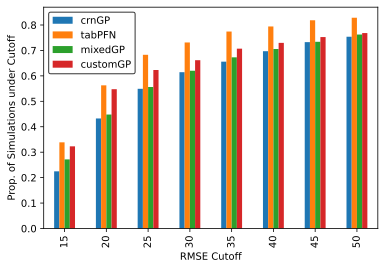

In [68]:
import matplotlib.pyplot as plt

cutoffs = [15,20,25,30,35,40,45,50]
buckets = []
sims_rmse = pd.concat(
    [
        df_rmse_crnGP,
        df_rmse_tabPFN,
        df_rmse_mixedGP,
        df_rmse_customGP
]
)
sims_rmse_wide = sims_rmse.pivot_table(index='sim_id',columns='experiment',values='rmse')
for cutoff in cutoffs:
    out = {}
    for col in sims_rmse['experiment'].unique():
        data = sims_rmse_wide[[col]].dropna()
        out[col] = (data[col] <= cutoff).mean()
    out['cutoff'] = cutoff
    buckets.append(out)
buckets = pd.DataFrame(buckets)
fig, ax = plt.subplots(figsize=(6,4))
buckets.plot.bar(x='cutoff',y=sims_rmse['experiment'].unique(),ax=ax)
ax.set_xlabel('RMSE Cutoff')
ax.set_ylabel('Prop. of Simulations under Cutoff')
plt.legend(edgecolor='black',facecolor='white');
fig.savefig('odin_experiments_crnGP_normalizing_flows_crnGP_tabPFN_mixedGP_customGP.png',dpi=500,bbox_inches='tight')

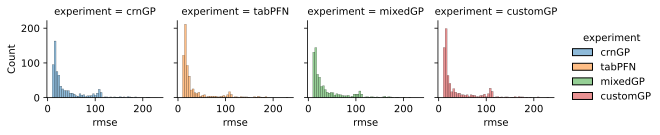

In [69]:
import seaborn as sns
ax = sns.displot(sims_rmse,x='rmse',col='experiment',hue='experiment',height=2)

<Axes: xlabel='rmse', ylabel='Proportion'>

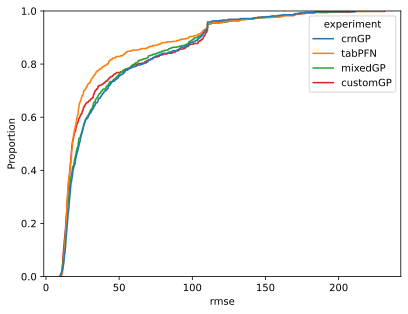

In [70]:
sns.ecdfplot(sims_rmse,x='rmse',hue='experiment')

<Axes: xlabel='seed'>

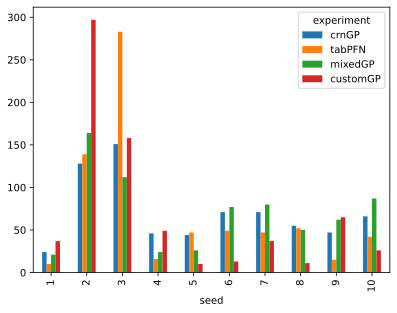

In [71]:
df_seeds = df_results.groupby('experiment')['seed'].value_counts().reset_index()
df_seeds['seed'] = df_seeds['seed'].astype(int)
df_seeds = df_seeds.pivot_table(index='seed',columns='experiment',values='count').reset_index()
df_seeds.plot.bar(x='seed',y=['crnGP','tabPFN','mixedGP','customGP'])



Text(0.02, 0.5, 'gamma')

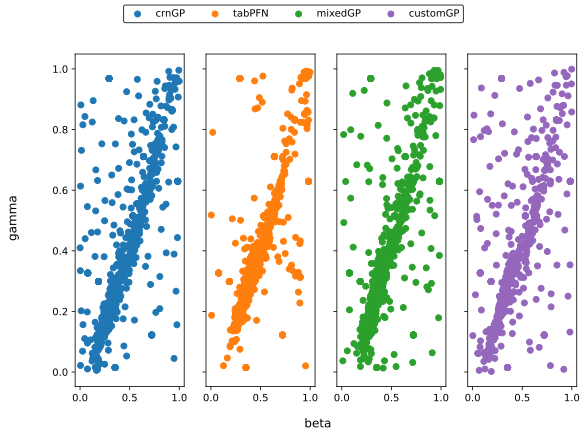

In [72]:
experiments = df_results['experiment'].unique()
colors = ['tab:blue','tab:orange','tab:green','tab:purple']
fig, ax = plt.subplots(ncols = len(experiments),sharex=True,sharey=True,figsize=(9,6))

for i, grouper in enumerate(df_results.groupby('experiment',sort=False)):
    exp, df = grouper
    ax[i].scatter(df['beta'],df['gamma'],label=exp,color=colors[i])
fig.legend(loc='upper center',ncols=len(experiments),edgecolor='black')
fig.supxlabel('beta')
fig.supylabel('gamma')
#fig.tight_layout()


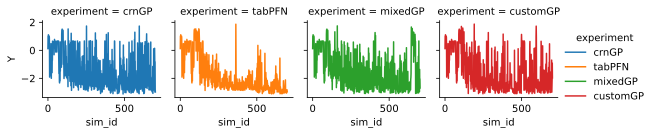

In [73]:
# the trace plot of each of the experiments (should go downward over simulation iterations)
sns.relplot(data = df_results, x = 'sim_id', y = 'Y', hue = 'experiment',col='experiment',kind='line',height=2)

Text(0, 0.5, 'Best Observed Value')

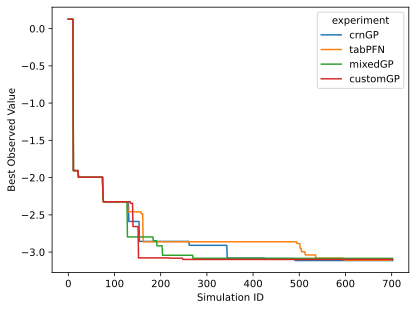

In [74]:
# best observed value over simulation iterations
ax = sns.lineplot(data = df_results, x = 'sim_id', y = 'bov', hue = 'experiment')
ax.set_xlabel('Simulation ID')
ax.set_ylabel('Best Observed Value')



In [75]:
# plot the sims

def assemble_sims(results,experiment):
    l = []
    counter = 0
    for x in results['simout_list']:
        for y in x:
            y['sim_id'] = counter
            counter+=1
            l.append(y)
    df = pd.concat(l)
    df['experiment'] = experiment
    return df
experiment2sims = {
    'crnGP': crnGP_results,
    'tabPFN': tabPFN_results,
    'mixedGP': mixedGP_results,
    'customGP': customGP_results
}
sims = pd.concat(
    [
        assemble_sims(v,k) for k,v in experiment2sims.items()
    ]
)

fig, ax = plt.subplots(ncols=4,figsize=(9,6),sharex=True,sharey=True)
colors = ['tab:blue','tab:orange','tab:green','tab:purple']
for i, exp_sims_exp in enumerate(sims.groupby('experiment',sort=False)):
    count = 0
    experiment, sims_exp = exp_sims_exp
    for idx, group in sims_exp.groupby('sim_id'):
        label = experiment if count == 0 else None
        ax[i].plot(group['T'],group['n_SI'],alpha=0.2,color=colors[i],label=label)
        count +=1
    ax[i].plot(ground_truth['T'],ground_truth['ground_truth'],color='black')
fig.legend(ncols=4,edgecolor='black',loc='upper center')
fig.supxlabel('Time')
fig.supylabel('Infections')




Text(0.02, 0.5, 'Infections')

Text(0, 0.5, 'Infections')

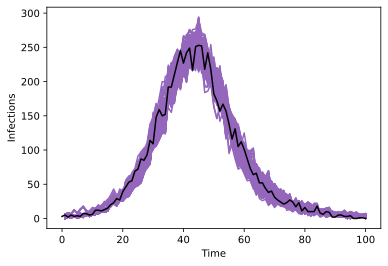

In [76]:
# plot the best customGP sims
sims_customGP = assemble_sims(customGP_results,'customGP')
rmse_15 = df_rmse_customGP.loc[df_rmse_customGP['rmse']<=15]['sim_id'].unique().tolist()
sims_customGP_best = sims_customGP.query('sim_id == @rmse_15').copy()

fig, ax = plt.subplots(figsize=(6,4))

for idx, group in sims_customGP_best.groupby('sim_id'):
    label = 'Sims' if count == 0 else None
    ax.plot(group['T'],group['n_SI'],color=colors[i],label=label)
    count +=1
ax.plot(ground_truth['T'],ground_truth['ground_truth'],color='black')
ax.set_xlabel('Time')
ax.set_ylabel('Infections')

In [77]:
'''
make a categorical kernel
from botorch.models.kernels.categorical import CategoricalKernel

kernel = CategoricalKernel()
kernel(X[:,-1]).evaluate_kernel().to_dense()
'''

'\nmake a categorical kernel\nfrom botorch.models.kernels.categorical import CategoricalKernel\n\nkernel = CategoricalKernel()\nkernel(X[:,-1]).evaluate_kernel().to_dense()\n'